# import basic libraries

In [128]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler,LabelEncoder
import warnings
warnings.simplefilter('ignore')

In [129]:
%matplotlib inline

In [130]:
# load the dataset
data=pd.read_csv('churn.csv')
data

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,1,KS,area_code_415,128,yes,25,no,10.0,3,2.70,...,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,2,OH,area_code_415,107,yes,26,no,13.7,3,3.70,...,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
2,3,NJ,area_code_415,137,no,0,no,12.2,5,3.29,...,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
3,4,OH,area_code_408,84,no,0,yes,6.6,7,1.78,...,71,50.9,61.9,88,5.26,196.9,89,8.86,2,no
4,5,OK,area_code_415,75,no,0,yes,10.1,3,2.73,...,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,HI,area_code_408,50,yes,40,no,9.9,5,2.67,...,127,40.07,223,126,18.96,297.5,116,13.39,2,no
4996,4997,WV,area_code_415,152,no,0,no,14.7,2,3.97,...,90,31.31,256.8,73,21.83,213.6,113,9.61,3,yes
4997,4998,DC,area_code_415,61,no,0,no,13.6,4,3.67,...,89,23.9,172.8,128,14.69,212.4,97,9.56,1,no
4998,4999,DC,area_code_510,109,no,0,no,8.5,6,2.30,...,67,32.1,171.7,92,14.59,224.4,89,10.10,0,no


# examine data

In [131]:
data.shape

(5000, 21)

In [132]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      5000 non-null   int64  
 1   state           5000 non-null   object 
 2   area.code       5000 non-null   object 
 3   account.length  5000 non-null   int64  
 4   voice.plan      5000 non-null   object 
 5   voice.messages  5000 non-null   int64  
 6   intl.plan       5000 non-null   object 
 7   intl.mins       5000 non-null   float64
 8   intl.calls      5000 non-null   int64  
 9   intl.charge     5000 non-null   float64
 10  day.mins        5000 non-null   float64
 11  day.calls       5000 non-null   int64  
 12  day.charge      5000 non-null   object 
 13  eve.mins        5000 non-null   object 
 14  eve.calls       5000 non-null   int64  
 15  eve.charge      5000 non-null   float64
 16  night.mins      5000 non-null   float64
 17  night.calls     5000 non-null   i

In [133]:
data.describe()

,Unnamed: 0,account.length,voice.messages,intl.mins,intl.calls,intl.charge,day.mins,day.calls,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls
count,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,2500.500000,100.25860,7.755200,10.261780,4.435200,2.771196,180.288900,100.029400,100.191000,17.054322,200.391620,99.919200,9.017732,1.570400
std,1443.520003,39.69456,13.546393,2.761396,2.456788,0.745514,53.894699,19.831197,19.826496,4.296843,50.527789,19.958686,2.273763,1.306363
min,1.000000,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1250.750000,73.00000,0.000000,8.500000,3.000000,2.300000,143.700000,87.000000,87.000000,14.140000,166.900000,87.000000,7.510000,1.000000
50%,2500.500000,100.00000,0.000000,10.300000,4.000000,2.780000,180.100000,100.000000,100.000000,17.090000,200.400000,100.000000,9.020000,1.000000
75%,3750.250000,127.00000,17.000000,12.000000,6.000000,3.240000,216.200000,113.000000,114.000000,19.900000,234.700000,113.000000,10.560000,2.000000
max,5000.000000,243.00000,52.000000,20.000000,20.000000,5.400000,351.500000,165.000000,170.000000,30.910000,395.000000,175.000000,17.770000,9.000000


In [134]:
data.nunique()

Unnamed: 0        5000
state               51
area.code            3
account.length     218
voice.plan           2
voice.messages      48
intl.plan            2
intl.mins          170
intl.calls          21
intl.charge        170
day.mins          1961
day.calls          123
day.charge        1962
eve.mins          1877
eve.calls          126
eve.charge        1659
night.mins        1853
night.calls        131
night.charge      1028
customer.calls      10
churn                2
dtype: int64

In [135]:
data.isnull().sum()

Unnamed: 0        0
state             0
area.code         0
account.length    0
voice.plan        0
voice.messages    0
intl.plan         0
intl.mins         0
intl.calls        0
intl.charge       0
day.mins          0
day.calls         0
day.charge        0
eve.mins          0
eve.calls         0
eve.charge        0
night.mins        0
night.calls       0
night.charge      0
customer.calls    0
churn             0
dtype: int64

# handling missing values and duplicates,correct datatypes

In [136]:
#correcting data types of the set
data['day.charge']=pd.to_numeric(data['day.charge'],errors='coerce')
data['eve.mins']=pd.to_numeric(data['eve.mins'],errors='coerce')

In [137]:
data.describe()

,Unnamed: 0,account.length,voice.messages,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls
count,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,4993.000000,4976.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,2500.500000,100.25860,7.755200,10.261780,4.435200,2.771196,180.288900,100.029400,30.653501,200.580326,100.191000,17.054322,200.391620,99.919200,9.017732,1.570400
std,1443.520003,39.69456,13.546393,2.761396,2.456788,0.745514,53.894699,19.831197,9.166356,50.554637,19.826496,4.296843,50.527789,19.958686,2.273763,1.306363
min,1.000000,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1250.750000,73.00000,0.000000,8.500000,3.000000,2.300000,143.700000,87.000000,24.430000,166.275000,87.000000,14.140000,166.900000,87.000000,7.510000,1.000000
50%,2500.500000,100.00000,0.000000,10.300000,4.000000,2.780000,180.100000,100.000000,30.620000,201.000000,100.000000,17.090000,200.400000,100.000000,9.020000,1.000000
75%,3750.250000,127.00000,17.000000,12.000000,6.000000,3.240000,216.200000,113.000000,36.750000,234.100000,114.000000,19.900000,234.700000,113.000000,10.560000,2.000000
max,5000.000000,243.00000,52.000000,20.000000,20.000000,5.400000,351.500000,165.000000,59.760000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,9.000000


In [138]:
data.fillna({'day.charge':data['day.charge'].median(),'eve.mins':data['eve.mins'].median()},inplace=True)

In [139]:
# remove unwanted column
data.drop(columns='Unnamed: 0',inplace=True)

# target variable analysis

In [140]:
data['churn'].value_counts()/len(data) # check percentage

churn
no     0.8586
yes    0.1414
Name: count, dtype: float64

In [141]:
data['churn'].value_counts() # check record wise

churn
no     4293
yes     707
Name: count, dtype: int64

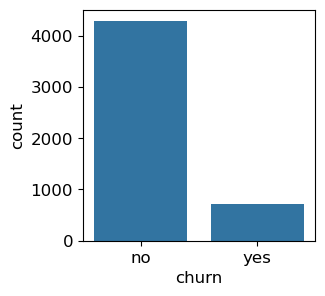

In [142]:
plt.figure(figsize=(3,3))
sns.countplot(x='churn',data=data)
plt.show()

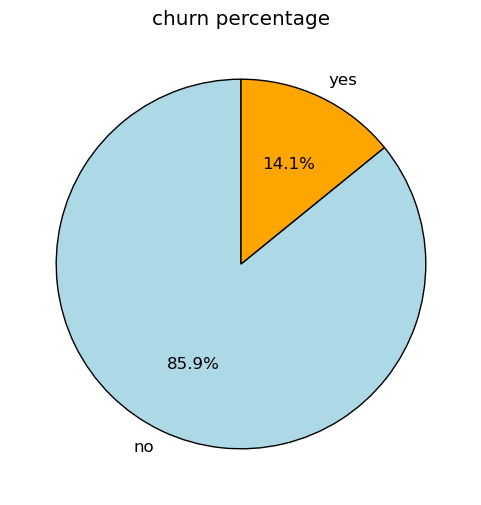

In [143]:
churn_counts=data['churn'].value_counts()
plt.figure(figsize=(6,6))
plt.pie(churn_counts,labels=churn_counts.index,autopct='%1.1f%%',colors=['lightblue','orange'],startangle=90,wedgeprops={'edgecolor':'black'})
plt.title('churn percentage')
plt.show()

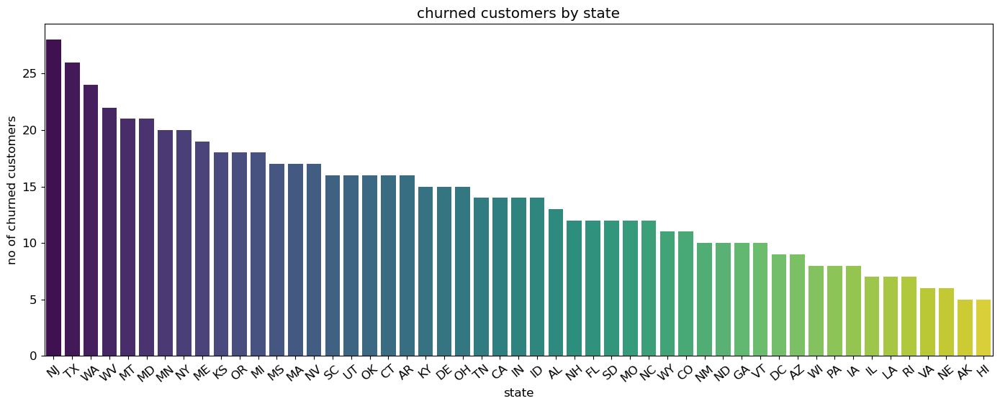

In [144]:
data_churned=data[data['churn']=='yes']
churn_by_state=data_churned['state'].value_counts()
plt.figure(figsize=(17,6))
sns.barplot(x=churn_by_state.index,y=churn_by_state.values,palette='viridis')
plt.xlabel('state')
plt.ylabel('no of churned customers')
plt.title('churned customers by state')
plt.xticks(rotation=40)
plt.show();

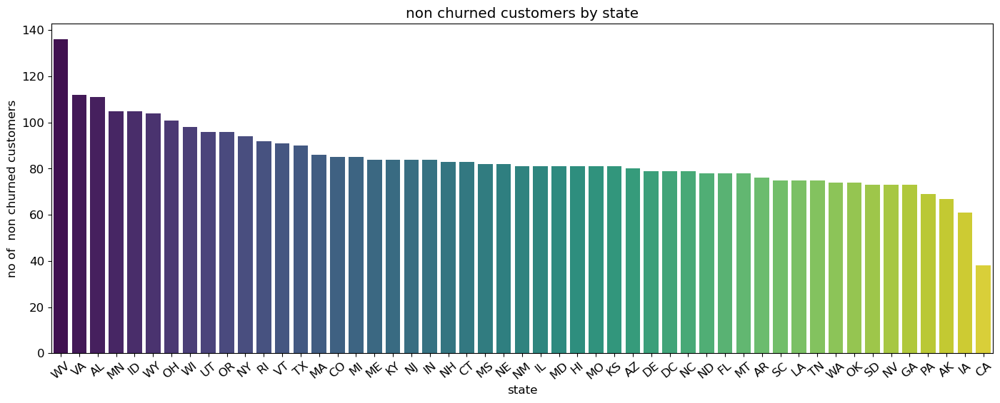

In [145]:
data_churned=data[data['churn']=='no']
churn_by_state=data_churned['state'].value_counts()
plt.figure(figsize=(17,6))
sns.barplot(x=churn_by_state.index,y=churn_by_state.values,palette='viridis')
plt.xlabel('state')
plt.ylabel('no of  non churned customers')
plt.title('non churned customers by state')
plt.xticks(rotation=40)
plt.show();

# univariate analysis (feature wise exploration)


<Figure size 1200x700 with 0 Axes>

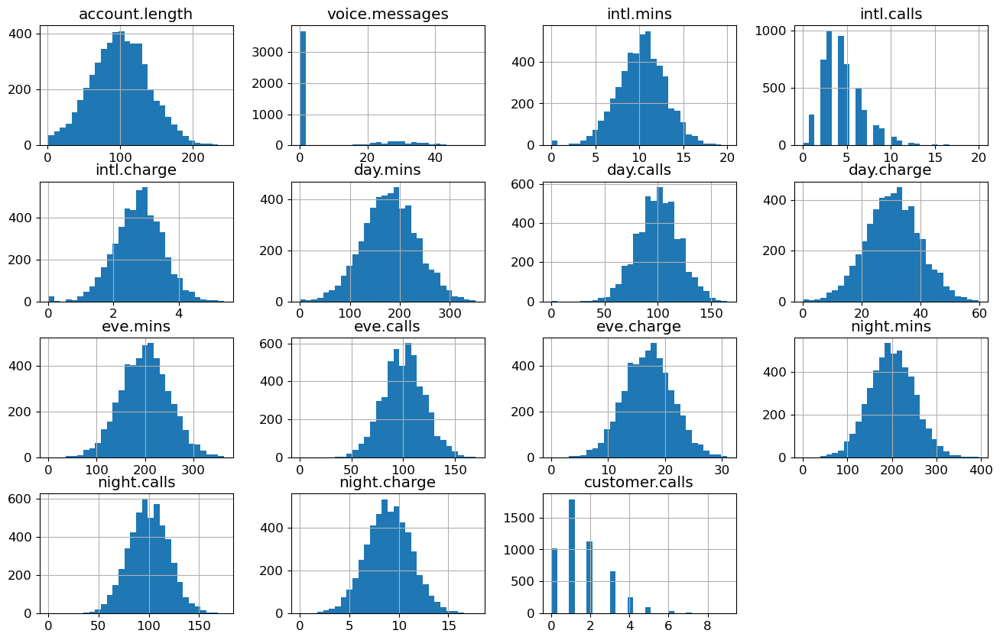

In [146]:
num_cols=data.select_dtypes(include=['float64','int64']).columns
plt.figure(figsize=(12,7))
data[num_cols].hist(bins=30,figsize=(16,10))
plt.title("univariate analysis:distrubution of numerical features")
plt.show();

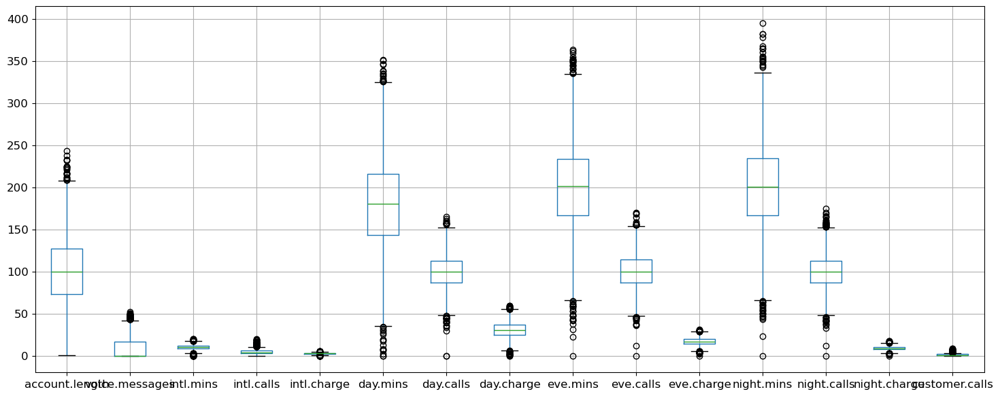

In [147]:
plt.figure(figsize=(18,7))
data.boxplot()
plt.show()

### removel of outliers is not necessary because each column represent custumers unique and independent behaviour

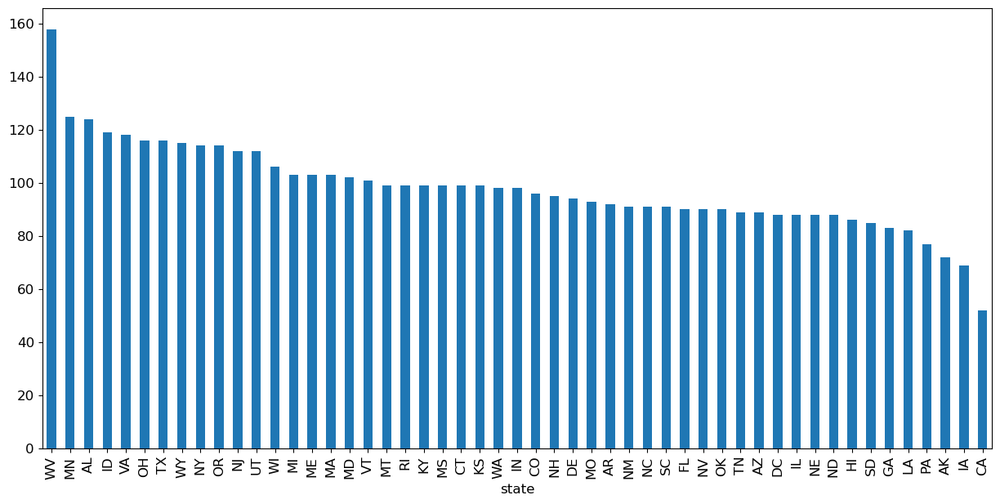

In [148]:
plt.figure(figsize=(15,7))
data['state'].value_counts().plot(kind='bar')
plt.show()

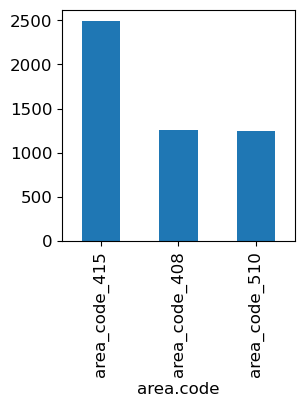

In [149]:
plt.figure(figsize=(3,3))
data['area.code'].value_counts().plot(kind='bar')
plt.show()

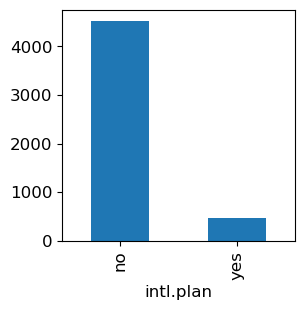

In [150]:
plt.figure(figsize=(3,3))
data['intl.plan'].value_counts().plot(kind='bar')
plt.show()

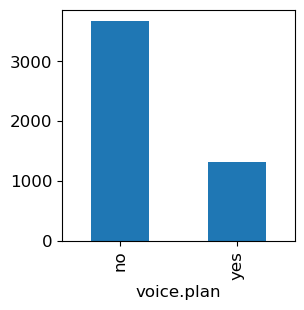

In [151]:
plt.figure(figsize=(3,3))
data['voice.plan'].value_counts().plot(kind='bar')
plt.show()

# bivariate analysis,multivariate analysis

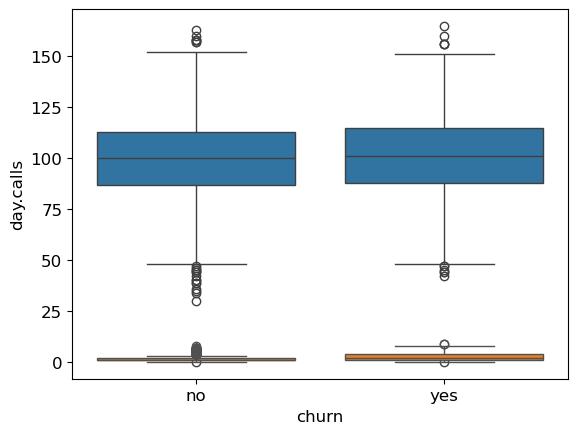

In [152]:
sns.boxplot(x='churn',y='day.calls',data=data);
sns.boxplot(x='churn',y='customer.calls',data=data);


<Axes: >

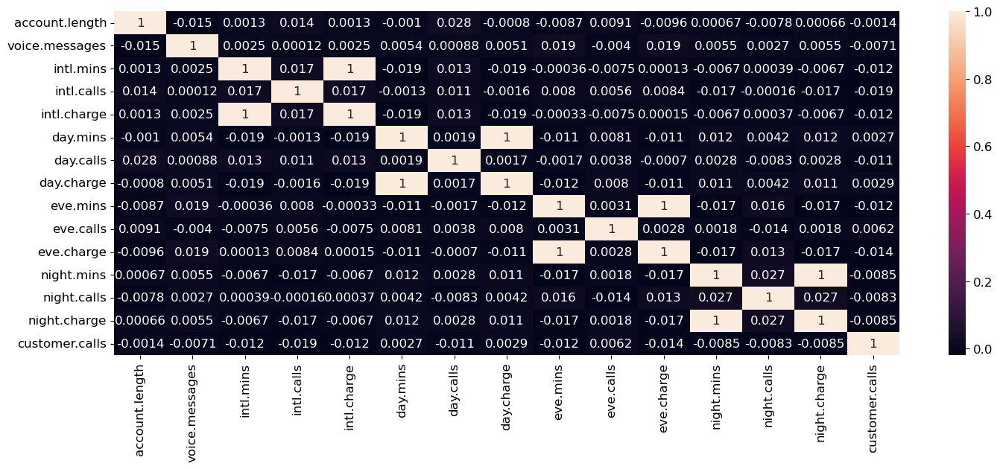

In [153]:
plt.figure(figsize=(17,6))
sns.heatmap(data.corr(numeric_only=True),annot=True)

In [154]:
corr=data.corr(numeric_only=True)
corr

,account.length,voice.messages,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls
account.length,1.000000,-0.014575,0.001291,0.014277,0.001292,-0.001017,0.028240,-0.000799,-0.008676,0.009143,-0.009587,0.000668,-0.007825,0.000656,-0.001445
voice.messages,-0.014575,1.000000,0.002463,0.000124,0.002505,0.005381,0.000883,0.005141,0.018869,-0.003954,0.019496,0.005541,0.002676,0.005535,-0.007086
intl.mins,0.001291,0.002463,1.000000,0.016791,0.999993,-0.019486,0.013097,-0.019282,-0.000356,-0.007458,0.000132,-0.006721,0.000391,-0.006717,-0.012122
intl.calls,0.014277,0.000124,0.016791,1.000000,0.016900,-0.001303,0.010893,-0.001597,0.007997,0.005574,0.008393,-0.017214,-0.000156,-0.017182,-0.019147
intl.charge,0.001292,0.002505,0.999993,0.016900,1.000000,-0.019415,0.013161,-0.019212,-0.000333,-0.007507,0.000155,-0.006655,0.000368,-0.006650,-0.012180
day.mins,-0.001017,0.005381,-0.019486,-0.001303,-0.019415,1.000000,0.001935,0.999769,-0.010906,0.008128,-0.010760,0.011799,0.004236,0.011783,0.002733
day.calls,0.028240,0.000883,0.013097,0.010893,0.013161,0.001935,1.000000,0.001666,-0.001719,0.003754,-0.000695,0.002804,-0.008308,0.002802,-0.010739
day.charge,-0.000799,0.005141,-0.019282,-0.001597,-0.019212,0.999769,0.001666,1.000000,-0.011530,0.007983,-0.011383,0.011317,0.004207,0.011301,0.002930
eve.mins,-0.008676,0.018869,-0.000356,0.007997,-0.000333,-0.010906,-0.001719,-0.011530,1.000000,0.003119,0.997671,-0.016503,0.015578,-0.016504,-0.012401
eve.calls,0.009143,-0.003954,-0.007458,0.005574,-0.007507,0.008128,0.003754,0.007983,0.003119,1.000000,0.002778,0.001781,-0.013682,0.001799,0.006235


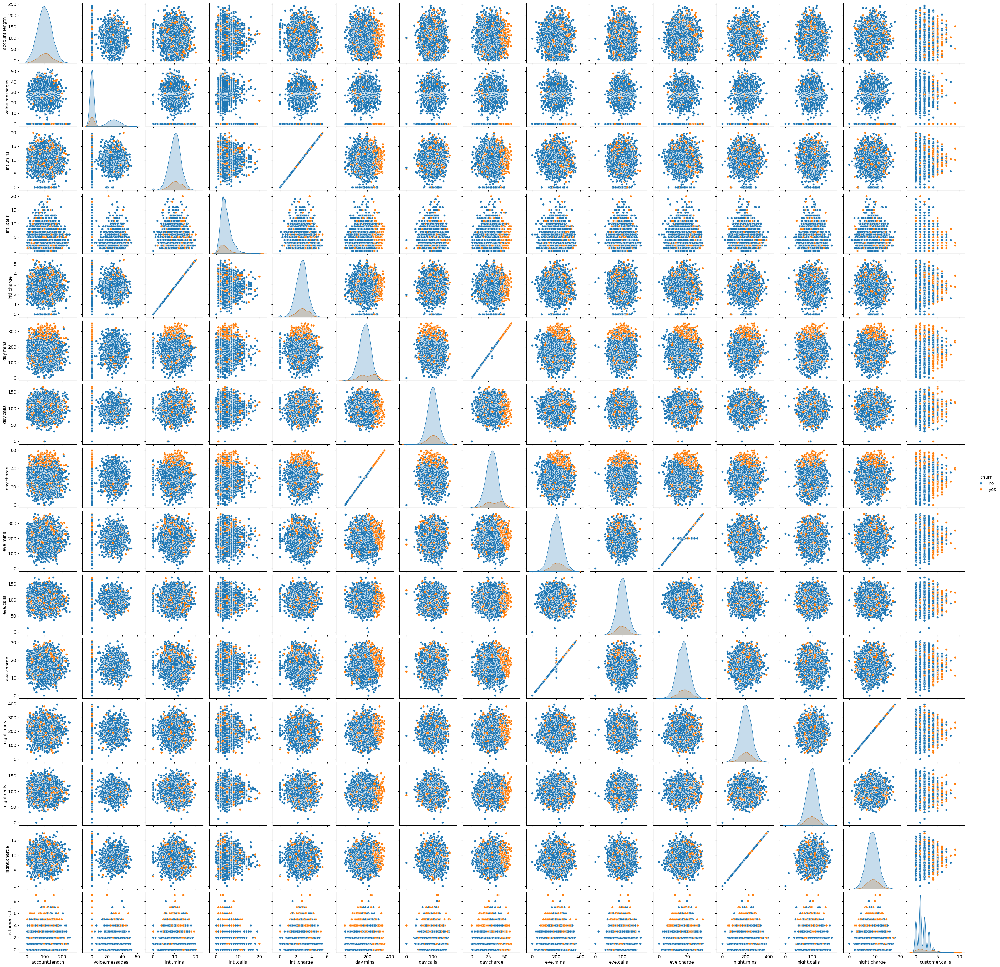

In [155]:
sns.pairplot(data,hue='churn')
plt.show()

In [156]:
df=data.copy()

# encoding categorical features

In [157]:
cat_data=df.select_dtypes(include=['object','category']).columns.tolist()
if 'churn' in cat_data:
    cat_data.remove('churn')
label=LabelEncoder()
for i in cat_data:
    df[i]=label.fit_transform(df[i])

# feature selection through mitual information

In [158]:
df1=df.copy()
from sklearn.feature_selection import mutual_info_classif

In [159]:
x=df.drop(columns='churn')
y=df['churn']
mi_score=mutual_info_classif(x,y,discrete_features='auto',random_state=92)
mi_df=pd.DataFrame({'features':x.columns,'mi_score':mi_score})
mi_df=mi_df.sort_values(by='mi_score',ascending=False)
print(mi_df)

          features  mi_score
11      day.charge  0.061228
9         day.mins  0.056329
5        intl.plan  0.033438
18  customer.calls  0.022621
4   voice.messages  0.010901
6        intl.mins  0.010646
7       intl.calls  0.010067
17    night.charge  0.004501
0            state  0.003960
8      intl.charge  0.003481
10       day.calls  0.003143
12        eve.mins  0.002100
16     night.calls  0.000126
3       voice.plan  0.000000
1        area.code  0.000000
2   account.length  0.000000
13       eve.calls  0.000000
14      eve.charge  0.000000
15      night.mins  0.000000


In [160]:
#select features with mi score >0.01
selected_features=mi_df[mi_df['mi_score']>0.01].features.tolist()
print('selected_features:',selected_features)

selected_features: ['day.charge', 'day.mins', 'intl.plan', 'customer.calls', 'voice.messages', 'intl.mins', 'intl.calls']


In [161]:
df1=df1[selected_features]
df1['churn']=y


In [162]:
df1

,day.charge,day.mins,intl.plan,customer.calls,voice.messages,intl.mins,intl.calls,churn
0,45.07,265.1,0,1,25,10.0,3,no
1,27.47,161.6,0,1,26,13.7,3,no
2,41.38,243.4,0,0,0,12.2,5,no
3,50.90,299.4,1,2,0,6.6,7,no
4,28.34,166.7,1,3,0,10.1,3,no
...,...,...,...,...,...,...,...,...
4995,40.07,235.7,0,2,40,9.9,5,no
4996,31.31,184.2,0,3,0,14.7,2,yes
4997,23.90,140.6,0,1,0,13.6,4,no
4998,32.10,188.8,0,0,0,8.5,6,no


# feature engineering(feature scaling)

In [163]:
df1.head(10)

,day.charge,day.mins,intl.plan,customer.calls,voice.messages,intl.mins,intl.calls,churn
0,45.07,265.1,0,1,25,10.0,3,no
1,27.47,161.6,0,1,26,13.7,3,no
2,41.38,243.4,0,0,0,12.2,5,no
3,50.90,299.4,1,2,0,6.6,7,no
4,28.34,166.7,1,3,0,10.1,3,no
5,37.98,223.4,1,0,0,6.3,6,no
6,37.09,218.2,0,3,24,7.5,7,no
7,26.69,157.0,1,0,0,7.1,6,no
8,31.37,184.5,0,1,0,8.7,4,no
9,43.96,258.6,1,0,37,11.2,5,no


In [164]:
df1.rename(columns={'day.charge':'day_charge',
                        'day.mins':'day_mins',
                        'intl.plan':'intl_plan',
                        'customer.calls':'customer_calls',
                        'voice.messages':'voice_messages',
                        'intl.mins':'intl_mins',
                        'intl.calls':'intl_calls'},inplace=True)


In [165]:
num_data=df1.select_dtypes(include=['int','float']).columns.tolist()
if 'intl.plan' in num_data:
    num_data.remove('intl.plan')
scaler=StandardScaler()
df1[num_data]=scaler.fit_transform(df1[num_data]);

In [166]:
df1

,day_charge,day_mins,intl_plan,customer_calls,voice_messages,intl_mins,intl_calls,churn
0,1.574027,1.573802,-0.323240,-0.436676,1.273145,-0.094809,-0.584236,no
1,-0.347576,-0.346802,-0.323240,-0.436676,1.346973,1.245227,-0.584236,no
2,1.171146,1.171125,-0.323240,-1.202236,-0.572549,0.701969,0.229917,no
3,2.210558,2.210292,3.093675,0.328885,-0.572549,-1.326194,1.044069,no
4,-0.252588,-0.252163,3.093675,1.094445,-0.572549,-0.058592,-0.584236,no
...,...,...,...,...,...,...,...,...
4995,1.028117,1.028239,-0.323240,0.328885,2.380562,-0.131027,0.229917,no
4996,0.071683,0.072577,-0.323240,1.094445,-0.572549,1.607399,-0.991312,yes
4997,-0.737356,-0.736489,-0.323240,-0.436676,-0.572549,1.209010,-0.177160,no
4998,0.157937,0.157937,-0.323240,-1.202236,-0.572549,-0.638067,0.636993,no


# check the state of the target(balance or imbalance)

In [247]:
df1['churn']=df1['churn'].map({'yes':1,'no':0})
df1['churn'].value_counts()

Series([], Name: count, dtype: int64)

In [168]:
# balance the yes class through smote 
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

In [169]:
df1.head()

,day_charge,day_mins,intl_plan,customer_calls,voice_messages,intl_mins,intl_calls,churn
0,1.574027,1.573802,-0.323240,-0.436676,1.273145,-0.094809,-0.584236,0
1,-0.347576,-0.346802,-0.323240,-0.436676,1.346973,1.245227,-0.584236,0
2,1.171146,1.171125,-0.323240,-1.202236,-0.572549,0.701969,0.229917,0
3,2.210558,2.210292,3.093675,0.328885,-0.572549,-1.326194,1.044069,0
4,-0.252588,-0.252163,3.093675,1.094445,-0.572549,-0.058592,-0.584236,0


In [170]:
x=df1.drop(columns='churn')
y=df1['churn']

In [171]:
#check distrubution before smote
print(y.value_counts())

churn
0    4293
1     707
Name: count, dtype: int64


In [172]:
# split data
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42,stratify=y)
#apply smote
smote=SMOTE(random_state=42)
x_train_resampled,y_train_resampled=smote.fit_resample(x_train,y_train)


In [173]:
# check distrubution after smote
print(y_train_resampled.value_counts())

churn
0    3434
1    3434
Name: count, dtype: int64


In [174]:
# size of the data set after smote
print(x_train.shape)
print(x_train_resampled.shape)
print(y_train.shape)
print(y_train_resampled.shape)


(4000, 7)
(6868, 7)
(4000,)
(6868,)


In [175]:
df2=df1.copy()

# EDA conclusions

# model 1 (logistic regression)

In [176]:
from sklearn.linear_model import LogisticRegression
model=LogisticRegression()
model.fit(x_train_resampled,y_train_resampled)

LogisticRegression()

In [177]:
train_predict = model.predict(x_train_resampled)
train_predict

array([0, 0, 0, ..., 1, 0, 1], dtype=int64)

### training metrices

In [178]:
from sklearn.metrics import classification_report,confusion_matrix,f1_score,roc_curve,precision_score,roc_auc_score,recall_score

In [179]:
cm = confusion_matrix(y_train_resampled, train_predict)
cm

array([[2632,  802],
       [ 781, 2653]], dtype=int64)

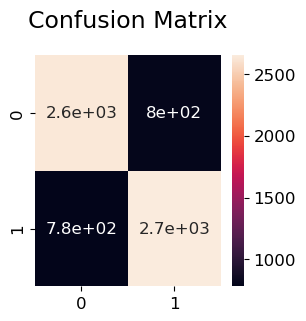

In [180]:
plt.figure(figsize=(3,3))

sns.heatmap(cm, 
            annot=True)      
            #xticklabels=['Attorney','No Attorney'],
            #yticklabels=['Attorney','No Attorney'])
#plt.ylabel('Actual', fontsize=13)
#plt.xlabel('Prediction', fontsize=13)
plt.title('Confusion Matrix', fontsize=17, pad=20)
plt.show()

In [181]:
print(classification_report(y_train_resampled,train_predict))

              precision    recall  f1-score   support

           0       0.77      0.77      0.77      3434
           1       0.77      0.77      0.77      3434

    accuracy                           0.77      6868
   macro avg       0.77      0.77      0.77      6868
weighted avg       0.77      0.77      0.77      6868



In [182]:
precision_score(y_train_resampled,train_predict,pos_label=1), recall_score(y_train_resampled,train_predict,pos_label=1)

(0.7678726483357453, 0.7725684333139197)

In [183]:
precision_score(y_train_resampled,train_predict,pos_label=0), recall_score(y_train_resampled,train_predict,pos_label=0)

(0.7711690594784647, 0.7664531158998252)

In [184]:
#auc-roc 
fpr, tpr, thresholds = roc_curve( y_train_resampled, train_predict,pos_label='yes')

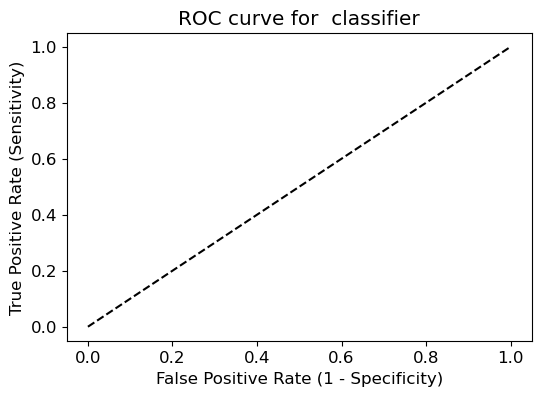

In [185]:
plt.figure(figsize=(6,4))
plt.title('ROC curve for  classifier')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')


plt.plot(fpr, tpr, linewidth=2)
#plt.plot([0,1], [0,1], 'k--' )
plt.plot([0,1],[0,1],
         color='black',
         linestyle='dashed'
        )
plt.show()

In [186]:
auc = roc_auc_score(y_train_resampled, train_predict)
auc

0.7695107746068724

# testing metrices

In [187]:
test_pred = model.predict(x_test)
test_pred

array([0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1,
       1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1,
       0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0,
       1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0,

In [188]:
cm = confusion_matrix(y_test, test_pred)
cm

array([[656, 203],
       [ 41, 100]], dtype=int64)

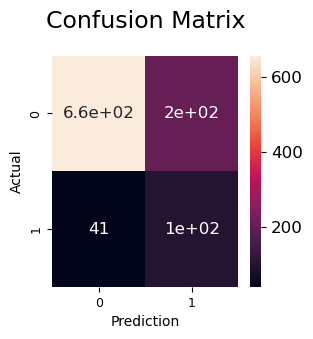

In [189]:
plt.figure(figsize=(3,3))
sns.heatmap(cm, 
            annot=True)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)

plt.ylabel('Actual', fontsize=10)
plt.xlabel('Prediction', fontsize=10)
plt.title('Confusion Matrix', fontsize=17, pad=20)
plt.show()

In [190]:
print(classification_report(y_test,test_pred))

              precision    recall  f1-score   support

           0       0.94      0.76      0.84       859
           1       0.33      0.71      0.45       141

    accuracy                           0.76      1000
   macro avg       0.64      0.74      0.65      1000
weighted avg       0.86      0.76      0.79      1000



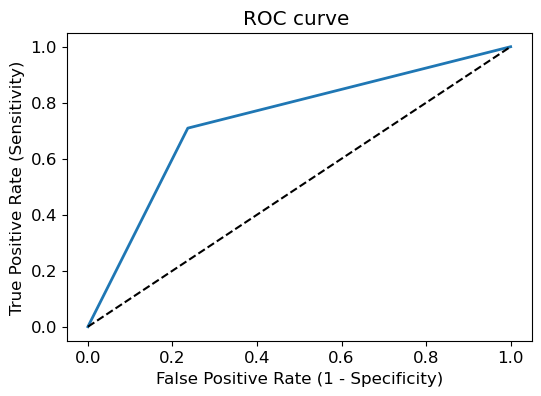

In [191]:
fpr, tpr, thresholds = roc_curve( y_test, test_pred)
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, linewidth=2)
plt.plot([0,1], [0,1], 'k--' )
plt.rcParams['font.size'] = 12
plt.title('ROC curve ')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')

plt.show()

In [192]:
auc = roc_auc_score(y_test, test_pred)
auc

0.736449277157176

# model 2 (decision tree)

In [193]:
from sklearn.metrics import classification_report,accuracy_score, confusion_matrix, roc_auc_score,roc_curve,precision_score,recall_score,f1_score
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
DT = DecisionTreeClassifier(random_state=42)
DT.fit(x_train,y_train)

DecisionTreeClassifier(random_state=42)

# metrices

In [194]:
train_predicted = DT.predict(x_train)
confusion_matrix(y_train, train_predicted)

array([[3434,    0],
       [   0,  566]], dtype=int64)

In [195]:
print(classification_report(y_train, train_predicted))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3434
           1       1.00      1.00      1.00       566

    accuracy                           1.00      4000
   macro avg       1.00      1.00      1.00      4000
weighted avg       1.00      1.00      1.00      4000



In [196]:
test_predicted=DT.predict(x_test)
confusion_matrix(y_train, train_predicted)

array([[3434,    0],
       [   0,  566]], dtype=int64)

In [197]:
print(classification_report(y_test, test_predicted))

              precision    recall  f1-score   support

           0       0.94      0.93      0.93       859
           1       0.58      0.61      0.60       141

    accuracy                           0.88      1000
   macro avg       0.76      0.77      0.76      1000
weighted avg       0.89      0.88      0.88      1000



### Visualize the tree

In [198]:
features = x.columns.values
features
classes = ['0','1']

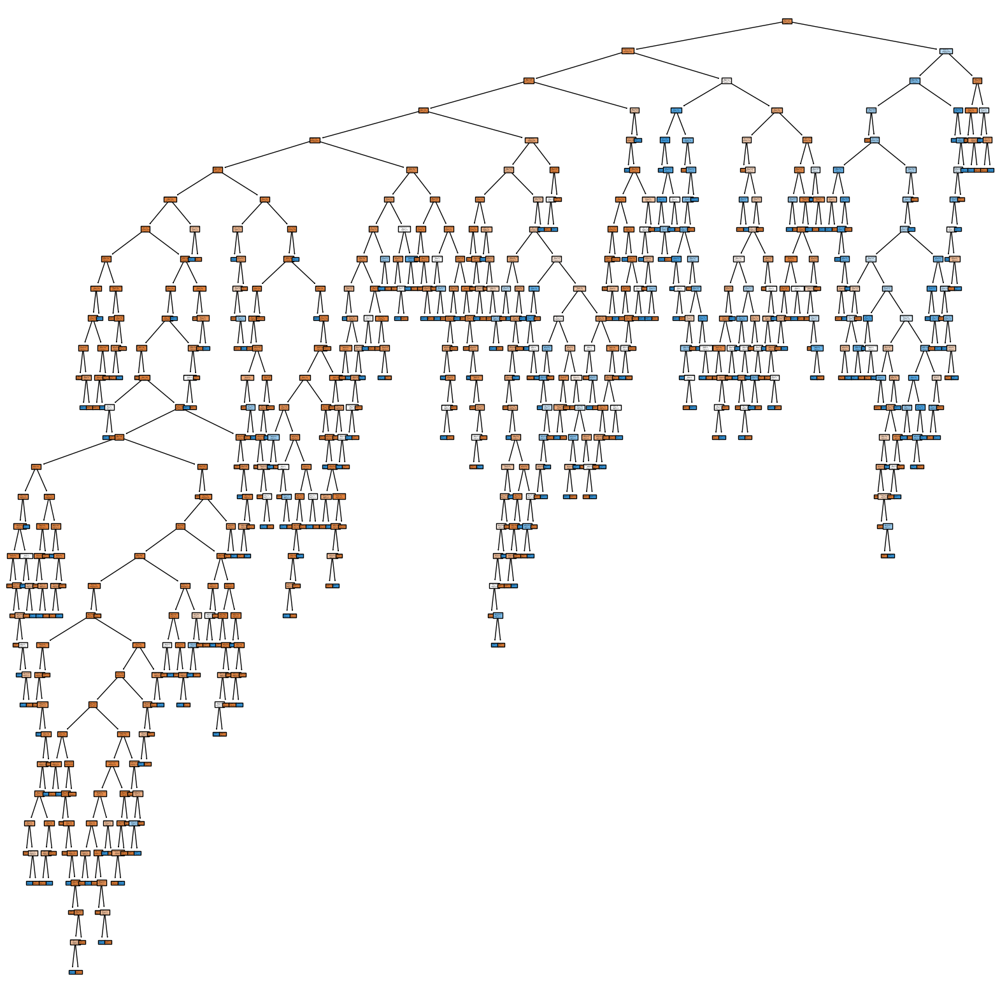

In [199]:
fig, axes = plt.subplots(figsize = (20,20))
tree.plot_tree(DT, feature_names=features, class_names=classes, filled=True )
plt.show()

### hyper parameter tuning

In [200]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'criterion':['gini','entropy','log_loss'],
    'max_depth': [3, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search =GridSearchCV(estimator=DT, param_grid=param_grid, cv=5, scoring='f1_macro', n_jobs=-1)
grid_search.fit(x_train, y_train)

# Best model
best_model = grid_search.best_estimator_

In [201]:
grid_search.best_params_

{'criterion': 'entropy',
 'max_depth': 5,
 'min_samples_leaf': 4,
 'min_samples_split': 10}

In [202]:
best_model

DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=4,
                       min_samples_split=10, random_state=42)

In [203]:
y_train_pred=best_model.predict(x_train)
print("Classification Report:\n", classification_report(y_train, y_train_pred, zero_division=0))

Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.98      0.96      3434
           1       0.85      0.63      0.73       566

    accuracy                           0.93      4000
   macro avg       0.90      0.81      0.84      4000
weighted avg       0.93      0.93      0.93      4000



In [204]:
#predictions
y_pred = best_model.predict(x_test)

#Evaluation metrics
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred, zero_division=0))


Confusion Matrix:
 [[843  16]
 [ 54  87]]
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.98      0.96       859
           1       0.84      0.62      0.71       141

    accuracy                           0.93      1000
   macro avg       0.89      0.80      0.84      1000
weighted avg       0.93      0.93      0.93      1000



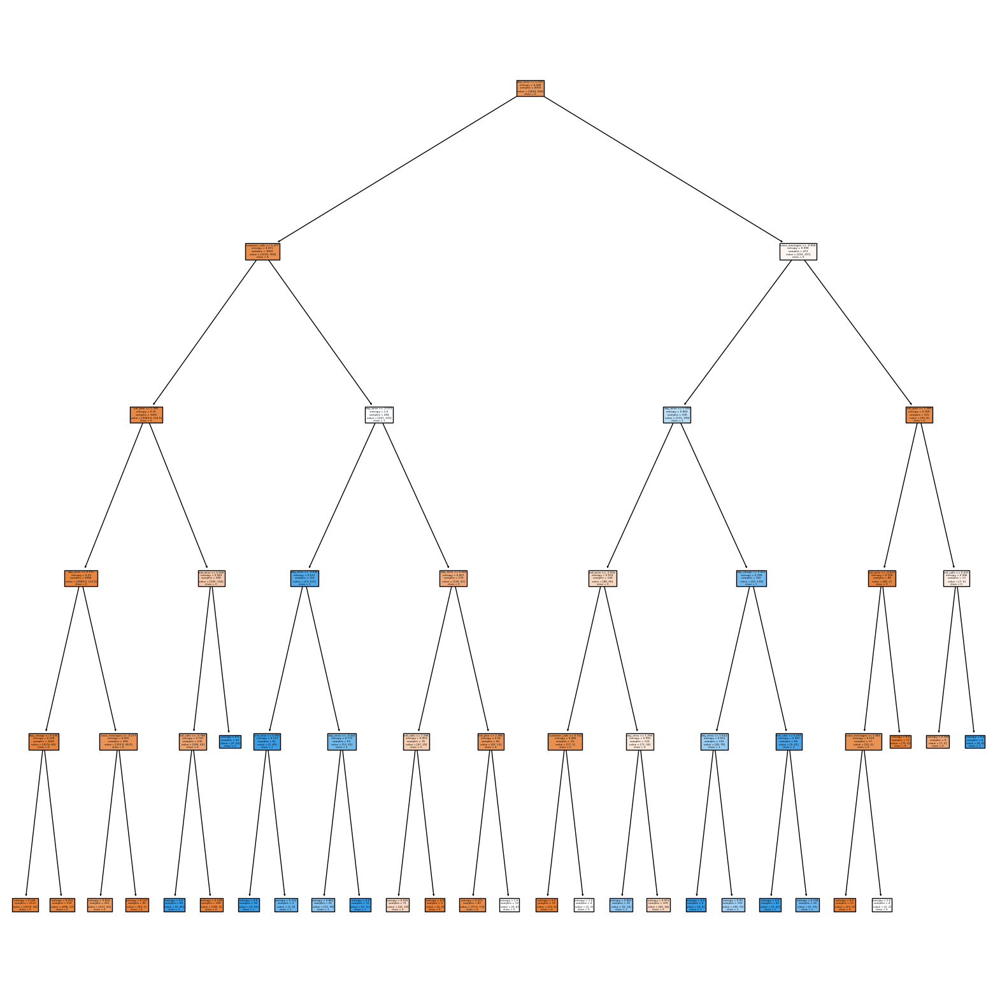

In [205]:
fig, axes = plt.subplots(figsize = (20,20))
tree.plot_tree(best_model, feature_names=features, class_names=classes, filled=True )
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

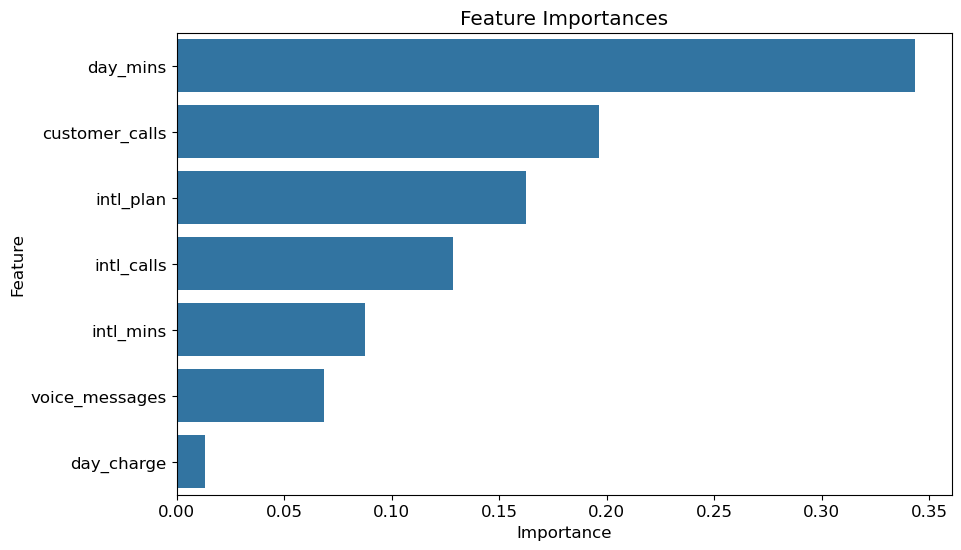

In [206]:
# Get feature importances
feature_importances = pd.DataFrame({
    'Feature': x_train.columns,
    'Importance': best_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importances)
plt.title('Feature Importances')
plt.show

###  even when i give imblanced dataset like(x_train,y_train) it is giving me same accuracy as like balanced dataset(x_train_resampled,y_train_resampled)
### so i can say that decision tree handle imbalanced data also

# model 3 (xgb)

In [207]:
#!pip install xgboost

In [208]:
from xgboost import XGBClassifier
import xgboost as xgb

In [209]:
xgb=xgb.XGBClassifier(n_estimators=500,learning_rate=0.3,reg_lambda=0,reg_alpha=0.2,min_child_weight=1,max_depth=10,gamma=0)

In [210]:
xgb.fit(x_train_resampled,y_train_resampled)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.3, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=500, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [211]:
y_train_pred=xgb.predict(x_train_resampled)
print(classification_report(y_train_resampled,y_train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3434
           1       1.00      1.00      1.00      3434

    accuracy                           1.00      6868
   macro avg       1.00      1.00      1.00      6868
weighted avg       1.00      1.00      1.00      6868



In [212]:
y_test_pred=xgb.predict(x_test)
print(classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94       859
           1       0.65      0.65      0.65       141

    accuracy                           0.90      1000
   macro avg       0.80      0.80      0.80      1000
weighted avg       0.90      0.90      0.90      1000



#### hyper parameter tuning for xgb

In [213]:
'''from sklearn.model_selection import GridSearchCV
param_grid = {
    'learning_rate':[0.1,0.01,0.2,0.3],
    'max_depth': [3, 5, 10,7],
    'n_estimators': [100, 500, 300,200],
    'gamma': [0, 0.1, 0.2,0.3],
    'min_child_wight':[1,3,5,7],
    'reg_alpha':[0,1,0.2,3],
    'reg_lambda':[0,1,4,7]
}

grid_search =GridSearchCV(estimator=xgb, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1,verbose=2)
grid_search.fit(x_train_resampled, y_train_resampled)

# Best model
best_model = grid_search.best_estimator_''';

In [214]:
# as it is time consuming so the values i got throgh hyper parameter tuning is replaced in the aboove model and re builded the model again

In [215]:
grid_search.best_params_

{'criterion': 'entropy',
 'max_depth': 5,
 'min_samples_leaf': 4,
 'min_samples_split': 10}

# model 4 (support vector machine)

In [216]:
from sklearn.svm import SVC

In [217]:
model = SVC(C=0.55, gamma=0.01, kernel='rbf')
model.fit(x_train_resampled,y_train_resampled)

SVC(C=0.55, gamma=0.01)

In [218]:
train_pred = model.predict(x_train_resampled)
print(confusion_matrix(y_train_resampled, train_pred))
print(classification_report(y_train_resampled, train_pred))

[[2845  589]
 [ 571 2863]]
              precision    recall  f1-score   support

           0       0.83      0.83      0.83      3434
           1       0.83      0.83      0.83      3434

    accuracy                           0.83      6868
   macro avg       0.83      0.83      0.83      6868
weighted avg       0.83      0.83      0.83      6868



In [219]:
tst_pred = model.predict(x_test)
print(confusion_matrix(y_test, tst_pred))
print(classification_report(y_test, tst_pred))

[[702 157]
 [ 28 113]]
              precision    recall  f1-score   support

           0       0.96      0.82      0.88       859
           1       0.42      0.80      0.55       141

    accuracy                           0.81      1000
   macro avg       0.69      0.81      0.72      1000
weighted avg       0.89      0.81      0.84      1000



### Hyperparameter Tuning

In [220]:
from sklearn.model_selection import GridSearchCV

In [221]:
pgrid = [
    {
        'C': [0.4,0.45,0.5,0.55,0.6],
        'gamma':[0.1,0.01,1],
        #'kernal':['poly','rbf','linear','sigmoid']
    }
    
]

In [222]:
model = SVC(kernel='poly')

In [223]:
grid = GridSearchCV(estimator=model,param_grid=pgrid, cv=10)

In [224]:
#grid.fit(x_train_resampled,y_train_resampled)

In [225]:
#grid.best_params_, grid.best_score_

In [226]:
#best_model=grid.best_estimator_

In [227]:
train_pred=best_model.predict(x_train_resampled)
print(confusion_matrix(y_train_resampled, train_pred))
print(classification_report(y_train_resampled, train_pred))

[[3372   62]
 [1320 2114]]
              precision    recall  f1-score   support

           0       0.72      0.98      0.83      3434
           1       0.97      0.62      0.75      3434

    accuracy                           0.80      6868
   macro avg       0.85      0.80      0.79      6868
weighted avg       0.85      0.80      0.79      6868



In [228]:
tst_pred=best_model.predict(x_test)
print(confusion_matrix(y_test, tst_pred))
print(classification_report(y_test, tst_pred))

[[843  16]
 [ 54  87]]
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       859
           1       0.84      0.62      0.71       141

    accuracy                           0.93      1000
   macro avg       0.89      0.80      0.84      1000
weighted avg       0.93      0.93      0.93      1000



# model 5(knn)

In [229]:
from sklearn.neighbors import KNeighborsClassifier

In [230]:
model = KNeighborsClassifier(n_neighbors=5)
model.fit(x_train_resampled,y_train_resampled)

KNeighborsClassifier()

In [231]:
ytrain_pred = model.predict(x_train_resampled)

In [232]:
cm = confusion_matrix(y_train_resampled, ytrain_pred)
cm

array([[3068,  366],
       [  64, 3370]], dtype=int64)

In [233]:
print(classification_report(y_train_resampled,ytrain_pred))

              precision    recall  f1-score   support

           0       0.98      0.89      0.93      3434
           1       0.90      0.98      0.94      3434

    accuracy                           0.94      6868
   macro avg       0.94      0.94      0.94      6868
weighted avg       0.94      0.94      0.94      6868



In [234]:
ytst_pred = model.predict(x_test)

In [235]:
cm = confusion_matrix(y_test, ytst_pred)
cm

array([[736, 123],
       [ 39, 102]], dtype=int64)

In [236]:
print(classification_report(y_test,ytst_pred))

              precision    recall  f1-score   support

           0       0.95      0.86      0.90       859
           1       0.45      0.72      0.56       141

    accuracy                           0.84      1000
   macro avg       0.70      0.79      0.73      1000
weighted avg       0.88      0.84      0.85      1000



#### Finding K

In [237]:
param_grid={'n_neighbors':range(1,30)}
knn=KNeighborsClassifier()

In [238]:
grid_search=GridSearchCV(estimator=knn,param_grid=param_grid,cv=5,scoring='accuracy')

In [239]:
grid_search.fit(x_train_resampled,y_train_resampled)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': range(1, 30)}, scoring='accuracy')

In [240]:
grid_search.best_params_

{'n_neighbors': 1}

In [241]:
best_model=grid_search.best_estimator_

In [242]:
tst_pred=best_model.predict(x_test)
cm=confusion_matrix(y_test,tst_pred)
cm

array([[777,  82],
       [ 54,  87]], dtype=int64)

In [243]:
print(classification_report(y_test,tst_pred))

              precision    recall  f1-score   support

           0       0.94      0.90      0.92       859
           1       0.51      0.62      0.56       141

    accuracy                           0.86      1000
   macro avg       0.72      0.76      0.74      1000
weighted avg       0.88      0.86      0.87      1000



## model deployment

In [244]:
import pickle
import joblib

In [245]:
pickle.dump(best_model,open("churn_model.pkl","wb"))
print("model saved as churn_model.pkl")

model saved as churn_model.pkl


In [246]:
with open("scaler.pkl","wb") as f:
    pickle.dump(scaler,f)

## code written in notepad